In [46]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
import mpld3
mpld3.enable_notebook()

# Ask a sharp question

![Winter in Chicago](chicago.jpg)

![Summer in Florida](fort-lauderdale-beach.jpg)

You have a three day weekend coming up. So you have a decision to make. 

**Do you buy a plane ticekt to Fort Lauderdale Florida?**

![Storm in Florida](hurricane-categories.jpg)

* Getting the decision wrong has a high cost. 
* The first step would to take this question and reduce to something for which you can get a number for an answer. 
* Take a step back and think about what outcome you want. 
* More than anything you want to swim! And for that your requirement is that the temperature should be less than 85F (29C).
* Also, you don't want to buy a plane ticket the day you decide to go. 
* Let's say you want to give yourself a three day window to buy the ticket to make travel arrangements. 

**Will the high temperature in Fort Lauderdale be above 85 degrees three days from now?** 

Now this is sharp enough and get data and try to get a answer to it. 

It is easy to overlook this process of starting out with a crisp question. 

One of the ways in which we can fall into a trap is by getting a big beautiful dataset and do some exploratory data analysis. 


![Storm in Florida](undirected-exploration.PNG)

![Hammer](hammer.PNG)

# Inspect the file 

* Our data is ordered by date. 
* Missing value for precipitation is -99.99 and for temperature is -99.9
* We do not yet know the units of precipitation. 
* Leap years are represented even in years which don't have them.   
* Sometimes temperature is missing when precipitation isn't. 
* Sometimes precipitation is missing when temperature isn't. 
* Starting in November 1966 there is a big chunk of missing data. 
* Sometimes minimum and mean temperature are missing but maximum isn't (14/11/1999)
* Min and max temperatures are reported in whole numbers. 
* Mean temperatures are always either round numbers or end in .5
* Closer inspection reveals that it is in fact the avergae of the minimum and the maximum. 
* So this is in fact mid-range and not the mean. Misleading column labels are also very common in datasets! 
* You might want to check how each of the column was measured, history of it, types of sensors used etc. 
* The more you learn about your data the more efficient you will be to pull out the information to answer your question. 
* Starting in 2015 the mean temperature column is ommited entirely. 
* Precipitation and temperature look like floats. They have five decimal places each but we don't know the meaningful accuracy yet. 

# Load the data

In [47]:
weather_filename = 'fort_lauderdale.csv'
weather_file = open(weather_filename)
weather_data = weather_file.read()
weather_file.close()

In [48]:
print(len(weather_data))
print(weather_data[:200])

1308103
COOPID, YEAR, MONTH, DAY, PRECIPITATION, MAX TEMP, MIN TEMP, MEAN TEMP
83168,1952,1,1,-99.99000,-99.90000,-99.90000, -99.90000
83168,1952,1,2,-99.99000,-99.90000,-99.90000, -99.90000
83168,1952,1,3,-9


# Convert data into lists

In [49]:
# Breaking data into lines
lines = weather_data.split('\n')

In [50]:
labels = lines[0]
values = lines[1:]
n_values = len(values)

In [51]:
print(len(lines))
for i in range(5):
    print(lines[i])

24154
COOPID, YEAR, MONTH, DAY, PRECIPITATION, MAX TEMP, MIN TEMP, MEAN TEMP
83168,1952,1,1,-99.99000,-99.90000,-99.90000, -99.90000
83168,1952,1,2,-99.99000,-99.90000,-99.90000, -99.90000
83168,1952,1,3,-99.99000,-99.90000,-99.90000, -99.90000
83168,1952,1,4,-99.99000,-99.90000,-99.90000, -99.90000


In [52]:
# Break the list of comma-separated values strings into list of values

# creating empty lists for date and max_temp
year = []
month = []
day = []
max_temp = []

# index of columns in the data file
j_year = 1
j_month = 2
j_day = 3
j_max_temp = 5

for i_row in range(n_values):
    split_values = values[i_row].split(',')
    #print(split_values)
    if len(split_values) >= j_max_temp: # taking care of missing columns
        year.append(int(split_values[j_year]))
        month.append(int(split_values[j_month]))
        day.append(int(split_values[j_day]))
        max_temp.append(float(split_values[j_max_temp]))

In [53]:
for i_day in range(100):
    print(max_temp[i_day])

-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
-99.9
80.0
82.0
83.0
83.0
85.0
85.0
70.0
75.0
75.0


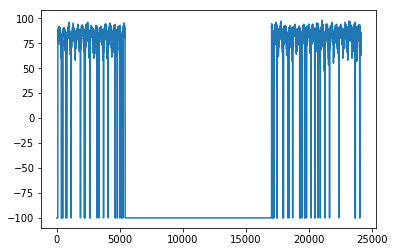

In [54]:
plt.plot(max_temp)

*  The y-axis shows us the maximum temperature for each day. 
* The x-axis shows the number of days since the beginning of days in our dataset. 
* The temperature values fall between a 50 and a 100. 
* Dispersed throughout the dataset are missing values. 

# Replace missing data with NaNs

In [55]:
# Isolate the recent data.
i_mid = len(max_temp) // 2
temps = np.array(max_temp[i_mid:])
year = year[i_mid:]
month = month[i_mid:]
day = day[i_mid:]
temps[np.where(temps == -99.9)] = np.nan

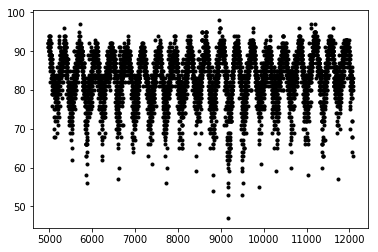

In [56]:
plt.plot(temps, color='black', marker='.', linestyle='none')

* There obvious annual fluctuations going down in the winter and up in the summer. 
* There is more variation in the low temperatures than in the high temperatures. 
* Meaning that on those cold days where high temperature was unusually low, sometimes they got much lower than usual. 
* When we squish the data together we see another pattern.The highs get higher and the lows get lower. This is an El Nino cycle where the water in the ocean is heated above a regular temperature. 

# Replace NaNs with estimates

In [57]:
print(np.where(np.isnan(temps)))

(array([    0,     1,     2, ..., 11978, 11979, 11980], dtype=int64),)


In [58]:
# Remove all the nans.
# Trim both ends and fill nans in the middle.
# Find the first non-nan.
i_start = np.where(np.logical_not(np.isnan(temps)))[0][0]
temps = temps[i_start:]
year = year[i_start:]
month = month[i_start:]
day = day[i_start:]
i_nans = np.where(np.isnan(temps))[0]

In [60]:
print(np.diff(i_nans))

[   7    4   10    8   66   55  229    1    1   13    1  448   39  366
   73    4  289  553    1    1    1    3    1   16    1    1    1   73
    1   79  222   16    1    1    1    1    1    1    1    1    1    1
    1    1    1  115  366  283    1    5   10    1    4  225    8    1
    2    1  191  366  366  732 1294    1   21  336    1    1    1    1
    1    1    1    1    1    1    1    1    1    1    1    1    1    1
    1]


* There's no regular pattern of missing values. 
* There are many consecutive days for which temperatures are missing. 

In [61]:
# Replace all nans with the most recent non-nan.
for i in range(temps.size):
    if np.isnan(temps[i]):
        temps[i] = temps[i - 1]

* We cannot just remove missing values since we are dealing with time series data. 
* We know that the weather in a given week and in a given season tend to be roughly the same. 
* Replace the missing temperature with the previous day's temperature. 
* This takes care of isolated missing values as well as repeated missing values. 

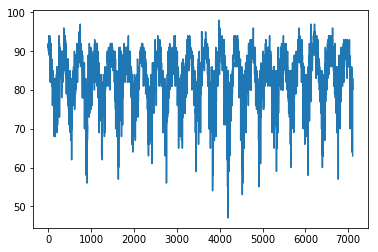

In [62]:
plt.plot(temps)

# Find your features

* The best features are the ones which are closely related to what we are trying to predict. 
* For predicting temperature the previous day's temperature is a reasonable feature. 

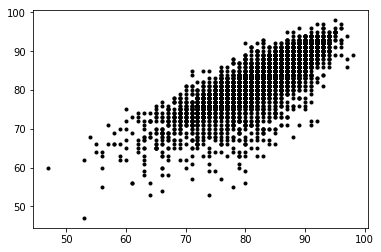

In [12]:
# Determine whether the previous day's temperature is related to the following day.
plt.plot(temps[:-1], temps[1:], color='black', marker='.', linestyle='none')
plt.show()

In [64]:
def scatter(x, y):
    """
    Make a scatter plot with jitter
    :param x: array containing numbers
    :param y: array containing numbers
    :return: plots a scatter plot with jitter
    """
    x_jitter = x + np.random.normal(size=x.size, scale=.5)
    y_jitter = y + np.random.normal(size=y.size, scale=.5)
    plt.plot(
        x_jitter, y_jitter,
        color='black',
        marker='.',
        linestyle='none',
        alpha=.1
    )
    plt.show()

## Inspect auto-correlation

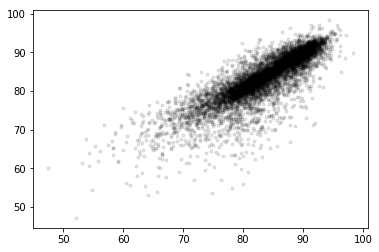

In [71]:
shift = 1
scatter(temps[:-shift], temps[shift:])

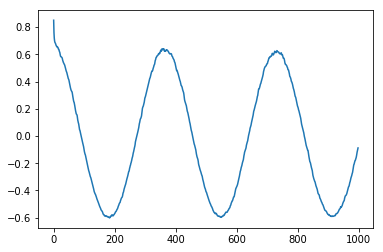

In [72]:
autocorr = []
for shift in range(1, 1000):
    correlation = np.corrcoef(temps[:-shift], temps[shift:])[1, 0]
    autocorr.append(correlation)
plt.plot(autocorr)

* There is a clear cyclical pattern with the period of one year. For eg. July temperatures for different years are more correlated them themselves than the temperature of winter months.
* There are local fluctuations in temperature but annual cycles trump anything else.
* This makes annual trend a prime example for the feature of our model. 

## Creating 10 day median for each day of the year

In [73]:
day_of_year = np.zeros(temps.size)

In [75]:
def find_day_of_year(year, month, day):
    """
    Convert year, month, date to day of the year
    :param year: int
    :param month: int
    :param day: int
    :return: day_of_year: int
    """
    days_per_month = np.array([
        31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31
    ])
    if year % 4 == 0:
        days_per_month[1] += 1

    day_of_year = np.sum(np.array(
        days_per_month[:month - 1]
    )) + day - 1
    return day_of_year

In [76]:
for i_row in range(temps.size):
    day_of_year[i_row] = find_day_of_year(
        year[i_row], month[i_row], day[i_row]
    )

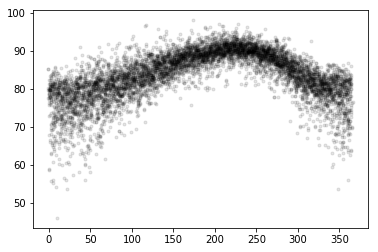

In [77]:
scatter(day_of_year, temps)

In [81]:
median_temp_calender = np.zeros(366)
ten_day_medians = np.zeros(temps.size)
for i_day in range(0, 365):
    low_day = i_day - 5
    high_day = i_day + 4
    if low_day < 0:
        low_day += 365
    if high_day > 365:
        high_day += -365
    if low_day < high_day:
        i_window_days = np.where(
            np.logical_and(day_of_year >= low_day,
                           day_of_year <= high_day)
            )
    else:
        i_window_days = np.where(
            np.logical_or(day_of_year >= low_day,
                          day_of_year <= high_day))
    ten_day_median = np.median(temps[i_window_days])
    median_temp_calender[i_day] = ten_day_median
    ten_day_medians[np.where(day_of_year == i_day)] = ten_day_median
    if i_day == 364:
        ten_day_medians[np.where(day_of_year == 365)] = ten_day_median
        median_temp_calender[365] = ten_day_median

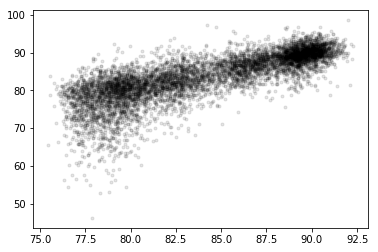

In [82]:
scatter(ten_day_medians, temps)

* There is a strong clustering of points along the y=x line. 
* There is strong droop near the bottom. 

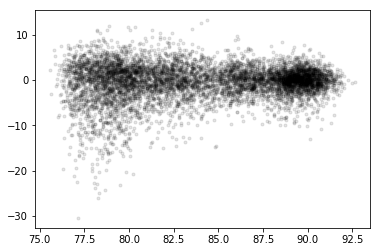

In [84]:
scatter(ten_day_medians, temps - ten_day_medians)

* There's a strong trend along the y=0 line. 
* When the temperatures are greater than 85F there is a relatively tight clustering. 

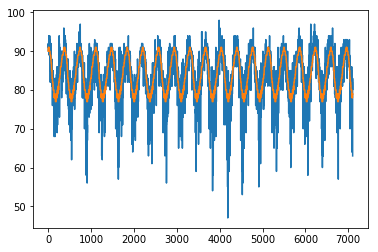

In [85]:
plt.plot(temps)
plt.plot(ten_day_medians)

# Building your model

In [87]:
def predict(day, month, year, temperature_calender):
    """
    For a given day, month, and year, predict the high temperature for the
    Fort Lauderdale beach.
    :param day: int
    :param month: int
    :param year: int
    :param temperature_calender: array of floats
        The typical temperature for each day of the year.
    :return:
    prediction: float
    """
    doy = find_day_of_year(year, month, day)
    prediction = temperature_calender[doy]
    return prediction

In [96]:
test_day = 27
test_year = 2015
test_month = 6
doy = find_day_of_year(test_year, test_month, test_day)
prediction = median_temp_calender[doy]
print(prediction)

89.0


In [97]:
for test_day in range(1, 30):
    test_year = 2015
    test_month = 6
    prediction = median_temp_calender[find_day_of_year(test_year, test_month, test_day)]
    print(test_year, test_month, test_day, prediction)

2015 6 1 87.0
2015 6 2 87.0
2015 6 3 87.0
2015 6 4 87.0
2015 6 5 87.0
2015 6 6 87.0
2015 6 7 87.0
2015 6 8 88.0
2015 6 9 88.0
2015 6 10 88.0
2015 6 11 88.0
2015 6 12 88.0
2015 6 13 88.0
2015 6 14 88.0
2015 6 15 88.0
2015 6 16 88.0
2015 6 17 88.5
2015 6 18 89.0
2015 6 19 88.5
2015 6 20 89.0
2015 6 21 89.0
2015 6 22 89.0
2015 6 23 89.0
2015 6 24 89.0
2015 6 25 89.0
2015 6 26 89.0
2015 6 27 89.0
2015 6 28 89.0
2015 6 29 89.0


In [98]:
residuals = np.zeros(temps.size)
doy = np.zeros(temps.size)
for i, temp in enumerate(temps):
    predicted_temp = median_temp_calender[find_day_of_year(year[i], month[i], day[i])]
    residuals[i] = temp - predicted_temp
    doy[i] = find_day_of_year(year[i], month[i], day[i])

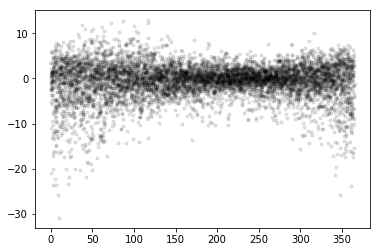

In [100]:
scatter(doy, residuals)

* We see large residuals especially in winter. 
* This means that in winters actual temperature many times less than the predicted temperature. 
* Good news for us is that during the summer months the temperature seems to be fairly consistent. 

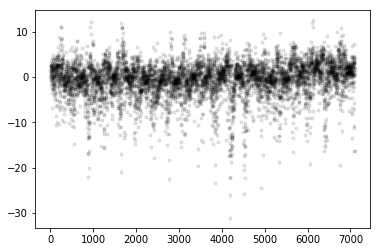

In [101]:
scatter(np.arange(residuals.size), residuals)

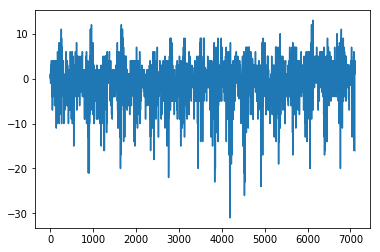

In [102]:
plt.plot(np.arange(residuals.size), residuals)

* The residuals change rather smoothly. 
* This means that if the residual at a certain day is positive, the residual for the next few days is also positive.

In [105]:
def find_autocorr(values, length=100):
    autocorr = []
    for shift in range(1, length):
        correlation = np.corrcoef(values[:-shift], values[shift:])[1, 0]
        autocorr.append(correlation)
    return autocorr

In [106]:
print(find_autocorr(residuals))

[0.6059037722441168, 0.36842674837491224, 0.2654591020746069, 0.21464311385625956, 0.19100066291075343, 0.1861900331756563, 0.17937947499047044, 0.16240735453227817, 0.1521877767342613, 0.14365432330041547, 0.14625430224520175, 0.13868399177914081, 0.13471000312070916, 0.14417072938182646, 0.144539335351082, 0.13542844901754816, 0.12140511314044139, 0.12976446587143306, 0.11836954850567052, 0.10463006935017244, 0.10166276227163906, 0.07816492612678674, 0.060959014922621506, 0.053289165454496065, 0.06377446608928865, 0.07149687656792882, 0.08169661407505745, 0.08842021258237254, 0.0942253039301928, 0.0808413403286337, 0.06991768345726704, 0.07260715905676185, 0.06518597984907301, 0.06887292223971526, 0.06946404066333783, 0.07407469810891817, 0.08062802168800111, 0.07676772469102716, 0.0691383095379197, 0.06623570494529753, 0.05780502980805584, 0.058979302134189955, 0.060865045674297694, 0.06458580071773053, 0.061671875042301816, 0.06039245699874389, 0.056471788081943995, 0.0495993790526

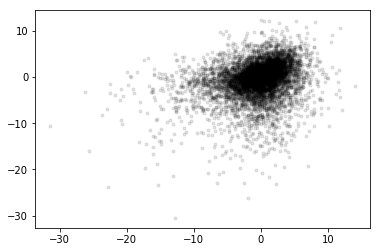

In [107]:
scatter(residuals[:-3], residuals[3:])

There is a subtle but a significant trend here.

In [112]:
print("RMSE before", np.sqrt(np.mean(residuals ** 2)))
print("MEA before", np.mean(np.abs(residuals)))

RMSE before 3.9067195663715446
MEA before 2.673001126126126


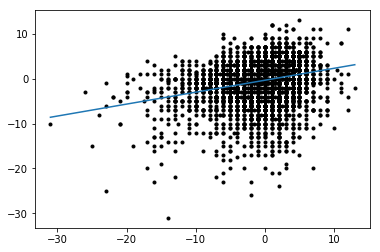

In [110]:
slope, intercept = np.polyfit(residuals[:-3], residuals[3:], 1)
plt.plot(residuals[:-3], residuals[3:], 'k.')
x_min = np.min(residuals)
x_max = np.max(residuals)
plt.plot([x_min, x_max], 
        [intercept + slope * x_min,
        intercept + slope * x_max])
plt.show()  

In [114]:
three_day_residuals = residuals[3:] - (
intercept + slope * residuals[:-3])

In [117]:
print("RMSE before", np.sqrt(np.mean(residuals ** 2)))
print("MEA before", np.mean(np.abs(residuals)))
print("RMSE after", np.sqrt(np.mean(three_day_residuals ** 2)))
print("MEA after", np.mean(np.abs(three_day_residuals)))

RMSE before 3.9067195663715446
MEA before 2.673001126126126
RMSE after 3.738589627549441
MEA after 2.6245733702008733
